# Facebook Prophet forecasting 2020

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

import plotly.graph_objects as go
import plotly
plotly.__version__

from fbprophet import Prophet
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

In [2]:
mea_df = pd.read_excel ('monthly export amount1.xlsx')
mea_df

,0,1,2,3,4,5,6,7,8,9,...,146,147,148,149,150,151,152,153,154,155
0,2007-01-01 00:00:00,2007-02-01 00:00:00,2007-03-01 00:00:00,2007-04-01 00:00:00,2007-05-01 00:00:00,2007-06-01 00:00:00,2007-07-01 00:00:00,2007-08-01 00:00:00,2007-09-01 00:00:00,2007-10-01 00:00:00,...,2019-03-01 00:00:00,2019-04-01 00:00:00,2019-05-01 00:00:00,2019-06-01 00:00:00,2019-07-01 00:00:00,2019-08-01 00:00:00,2019-09-01 00:00:00,2019-10-01 00:00:00,2019-11-01 00:00:00,2019-12-01 00:00:00
1,38223018,35866026,41532719,39443013,39852981,39387232,35048576,37669038,35534156,37291389,...,51935479,49858132,55511984,51068508,48912380,49320631,49234963,50888374,47479186,49775699


Because the data frame had 2 rows and 156 columns, it should be transposed to 2 columns which one of them is date and the other is amount.

In [3]:
mea_df_tr = mea_df.transpose()

In [4]:
mea_df_tr.columns = ['ds','y']
mea_df_tr

,ds,y
0,2007-01-01,38223018
1,2007-02-01,35866026
2,2007-03-01,41532719
3,2007-04-01,39443013
4,2007-05-01,39852981
...,...,...
151,2019-08-01,49320631
152,2019-09-01,49234963
153,2019-10-01,50888374
154,2019-11-01,47479186


Plotting all the datapoints with plotly.

In [5]:
fig = px.line(mea_df_tr, x='ds', y='y', title='Export trend in Canada')
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True, title_text='Year',
                 title_font=dict(size=20, family='Courier New, monospace'))
fig.update_yaxes(tickprefix="$",showline=True, linewidth=2, linecolor='black', mirror=True, title_text='1000 CAD',
                 title_font=dict(size=20, family='Courier New, monospace'))

fig.show()

Spliting the test and train parts, which 2019 is the test and the previous 12 years are train.

In [6]:
data = mea_df_tr['y']
test_size = int(0.077 * data.shape[0])
test = mea_df_tr.iloc[-test_size:]
train = mea_df_tr.iloc[:-test_size]

print(test.shape)
print(train.shape)

(12, 2)
(144, 2)


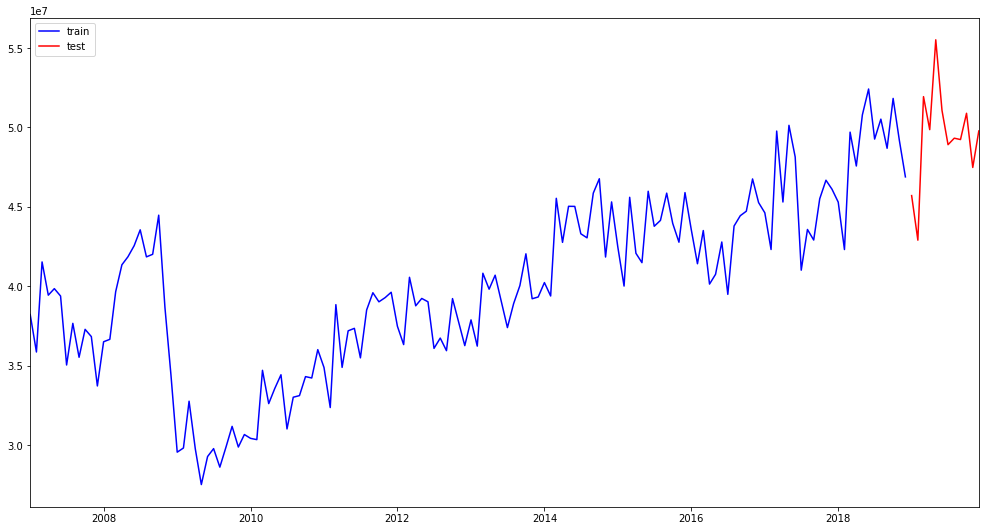

In [7]:
plt.figure(figsize=(17,9))

plt.plot(train['ds'],train['y'].values, c="blue", label="train")
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.autoscale(enable=True, axis='x', tight=True)
plt.legend()
plt.show();

Fitting the model to the train part and optimizing the hyperparameters by considering interval_width and changepoint_prior_scale which is Parameter modulating the flexibility of the automatic changepoint selection (Large values will allow many changepoints, small values will allow few changepoints).

In [8]:
model = Prophet(seasonality_mode='multiplicative',seasonality_prior_scale=15.0, uncertainty_samples=500,
                interval_width=0.60, changepoint_prior_scale=0.02)
model.fit(train)

INFO:numexpr.utils:NumExpr defaulting to 8 threads.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Predicting the test part according to our model:

In [9]:
future = model.make_future_dataframe(periods=test_size, freq='M', include_history=False)

In [10]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2018-12-31,4.669155e+07,4.415029e+07,4.951081e+07
1,2019-01-31,4.499468e+07,4.208747e+07,4.781934e+07
2,2019-02-28,5.086299e+07,4.837636e+07,5.368581e+07
3,2019-03-31,4.783653e+07,4.480402e+07,5.073448e+07
4,2019-04-30,4.940939e+07,4.645066e+07,5.208558e+07
5,2019-05-31,5.013302e+07,4.752781e+07,5.299477e+07
6,2019-06-30,4.706546e+07,4.422514e+07,4.988706e+07
7,2019-07-31,4.882651e+07,4.628756e+07,5.194343e+07
8,2019-08-31,4.920641e+07,4.667703e+07,5.211480e+07
9,2019-09-30,5.057600e+07,4.795971e+07,5.317926e+07


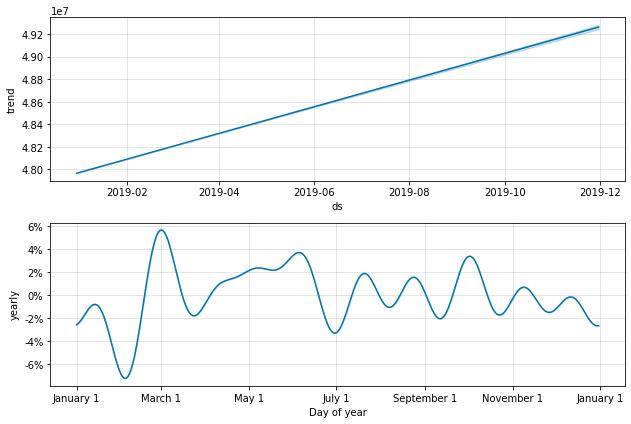

In [11]:
model.plot_components(forecast);

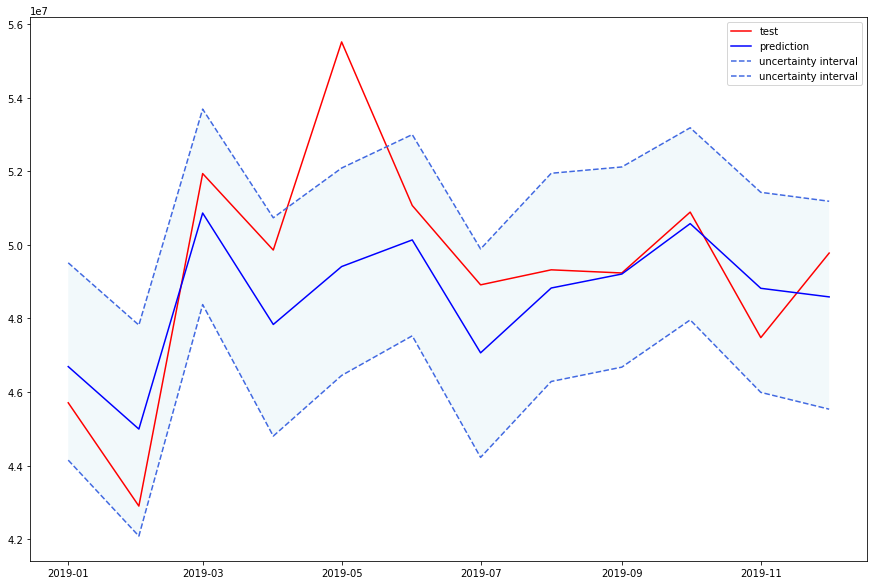

In [12]:
plt.figure(figsize=(15,10))


plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.plot(test['ds'], forecast['yhat'].values, c="blue", label="prediction")
plt.plot(test['ds'], forecast['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(test['ds'], forecast['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
ax.fill_between(test['ds'],  forecast['yhat_lower'], forecast['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.legend()
plt.show();

As the above graph shows, all the test data points are in the uncertainty intervals, except one point which has a sharp increase.

In [13]:
from fbprophet.plot import plot_plotly
import plotly.offline as py

py.init_notebook_mode()

fig = plot_plotly(model, forecast)  # This returns a plotly Figure
py.iplot(fig)



Root Mean Square Error (RMSE) is the standard deviation of the residuals (prediction errors). Residuals are a measure of how far from the regression line data points are; RMSE is a measure of how spread out these residuals are. In other words, it tells you how concentrated the data is around the line of best fit. Root mean square error is commonly used in climatology, forecasting, and regression analysis to verify experimental results.The formula is:
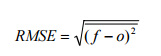

Because in this dataframe, all the data points are amounts in million, so the RMSE is shown a big amount. So, it's better to divide it to 10000000 to change in range 0~1.

In [14]:
from sklearn.metrics import mean_squared_error
from math import sqrt

print("RMSE: ",sqrt(mean_squared_error(test['y'].values, forecast['yhat'].values))/10000000)

RMSE:  0.2153687505907293


Now, predicting 2020 with the same model which has used in the test part.

In [15]:
model2 = Prophet(seasonality_mode='multiplicative',seasonality_prior_scale=15.0, uncertainty_samples=500,
                interval_width=0.60, changepoint_prior_scale=0.02)
model2.fit(mea_df_tr)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [16]:
future2 = model2.make_future_dataframe(periods=13, freq='M', include_history=False)

In [17]:
forecast2 = model2.predict(future2)
forecast2[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2019-12-31,4.807429e+07,4.519033e+07,5.035685e+07
1,2020-01-31,4.627989e+07,4.360910e+07,4.929047e+07
2,2020-02-29,5.264453e+07,4.981058e+07,5.532547e+07
3,2020-03-31,4.967246e+07,4.706222e+07,5.264085e+07
4,2020-04-30,5.171019e+07,4.910475e+07,5.461328e+07
5,2020-05-31,5.186087e+07,4.906791e+07,5.452031e+07
6,2020-06-30,4.877251e+07,4.596574e+07,5.148075e+07
7,2020-07-31,5.034381e+07,4.783717e+07,5.317837e+07
8,2020-08-31,5.067076e+07,4.784146e+07,5.337601e+07
9,2020-09-30,5.224065e+07,4.962586e+07,5.494599e+07


The above table shows the export amounts for each month in 2020 and the uncertainty bands, which we can see them in the below graphs, as well as the trends.

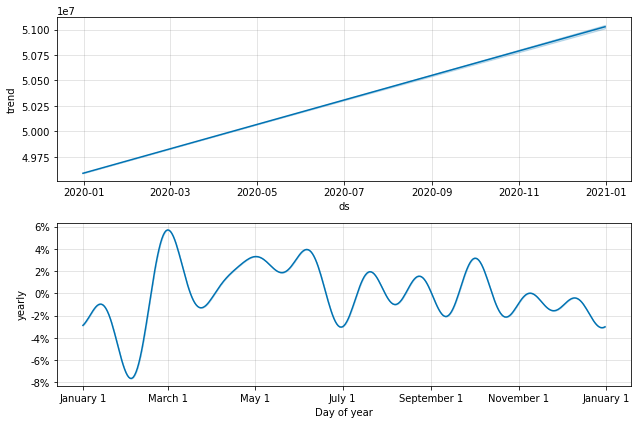

In [18]:
model2.plot_components(forecast2);

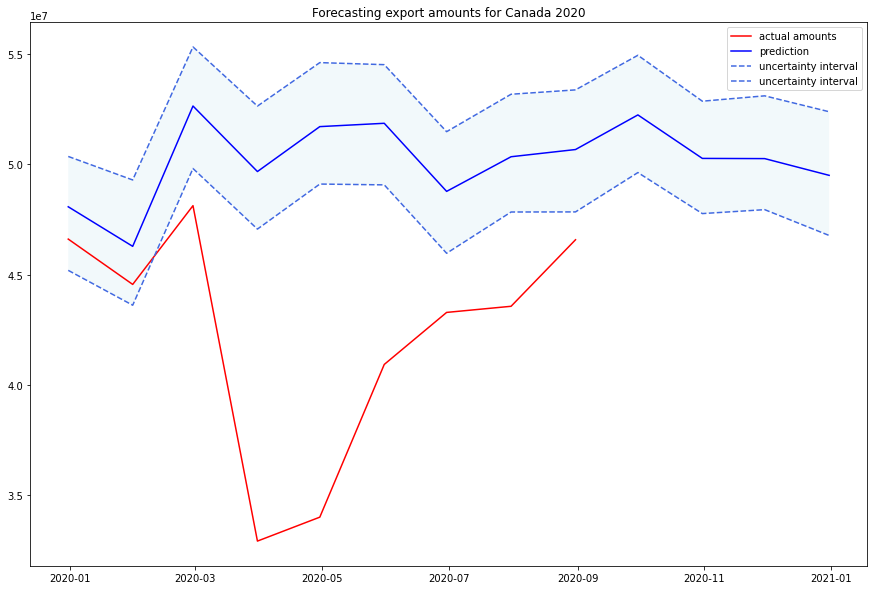

In [40]:
updated = [4.6608801e+07, 4.4552607e+07, 4.8124904e+07, 3.2910612e+07, 3.3996310e+07, 4.0922677e+07, 4.3282830e+07, 
           4.3560689e+07, 4.6579007e+07]

plt.figure(figsize=(15,10))

plt.plot(future2['ds'].iloc[0:9], updated, c="red", label="actual amounts" )
plt.plot(future2['ds'], forecast2['yhat'].values, c="blue", label="prediction")
plt.plot(future2['ds'], forecast2['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(future2['ds'], forecast2['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.title("Forecasting export amounts for Canada 2020")
ax = plt.gca()
ax.fill_between(future2['ds'],  forecast2['yhat_lower'], forecast2['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.legend()
plt.show();

In [20]:
fig = plot_plotly(model2, forecast2)  
py.iplot(fig)

Now, the same calculation to the import data.

In [21]:
mia_df = pd.read_excel ('monthly import amount1.xlsx')

In [22]:
mia_df_tr = mia_df.transpose()
mia_df_tr.columns = ['ds','y']
mia_df_tr

,ds,y
0,2007-01-01,32224562
1,2007-02-01,32242267
2,2007-03-01,37580303
3,2007-04-01,34869515
4,2007-05-01,35548764
...,...,...
151,2019-08-01,51815887
152,2019-09-01,49366806
153,2019-10-01,51827652
154,2019-11-01,47939304


In [23]:
fig = px.line(mia_df_tr, x='ds', y='y', title='Import trend in Canada')
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True, title_text='Year',
                 title_font=dict(size=20, family='Courier New, monospace'))
fig.update_yaxes(tickprefix="$",showline=True, linewidth=2, linecolor='black', mirror=True, title_text='1000 CAD',
                 title_font=dict(size=20, family='Courier New, monospace'))

fig.show()

In [24]:
data_i = mia_df_tr['y']
test_i_size = int(0.077 * data.shape[0])
test_i = mia_df_tr.iloc[-test_i_size:]
train_i = mia_df_tr.iloc[:-test_i_size]

print(test_i.shape)
print(train_i.shape)

(12, 2)
(144, 2)


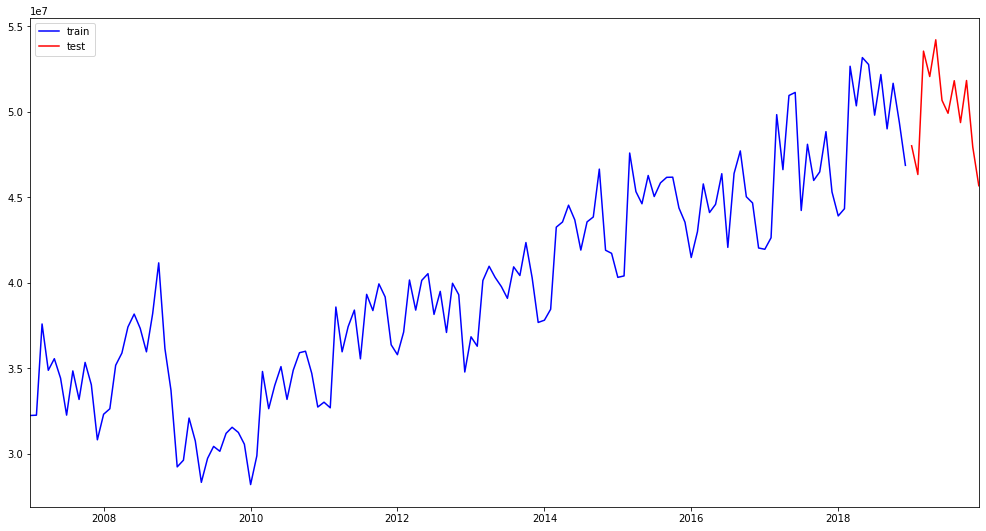

In [25]:
plt.figure(figsize=(17,9))
plt.plot(train_i['ds'],train_i['y'].values, c="blue", label="train")
plt.plot(test_i['ds'], test_i['y'].values, c="red", label="test")
plt.autoscale(enable=True, axis='x', tight=True)
plt.legend()
plt.show();

In [26]:
model_i = Prophet(seasonality_mode='multiplicative',seasonality_prior_scale=15.0, interval_width=0.79, 
                  changepoint_prior_scale=0.011, uncertainty_samples=500)

model_i.fit(train_i)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [27]:
future_i = model_i.make_future_dataframe(periods=test_i_size, freq='M', include_history=False)

In [28]:
forecast_i = model_i.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2018-12-31,4.669155e+07,4.415029e+07,4.951081e+07
1,2019-01-31,4.499468e+07,4.208747e+07,4.781934e+07
2,2019-02-28,5.086299e+07,4.837636e+07,5.368581e+07
3,2019-03-31,4.783653e+07,4.480402e+07,5.073448e+07
4,2019-04-30,4.940939e+07,4.645066e+07,5.208558e+07
5,2019-05-31,5.013302e+07,4.752781e+07,5.299477e+07
6,2019-06-30,4.706546e+07,4.422514e+07,4.988706e+07
7,2019-07-31,4.882651e+07,4.628756e+07,5.194343e+07
8,2019-08-31,4.920641e+07,4.667703e+07,5.211480e+07
9,2019-09-30,5.057600e+07,4.795971e+07,5.317926e+07


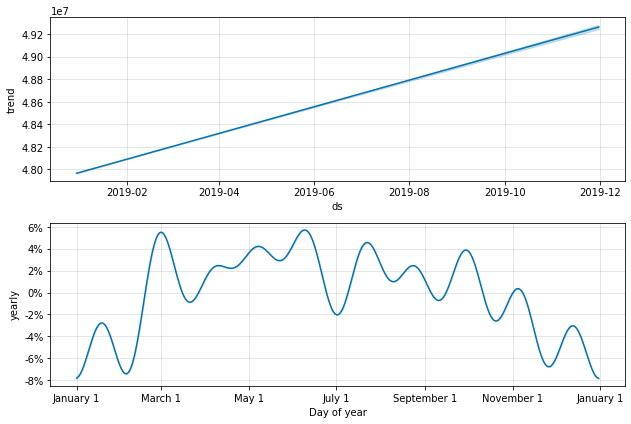

In [29]:
model_i.plot_components(forecast);

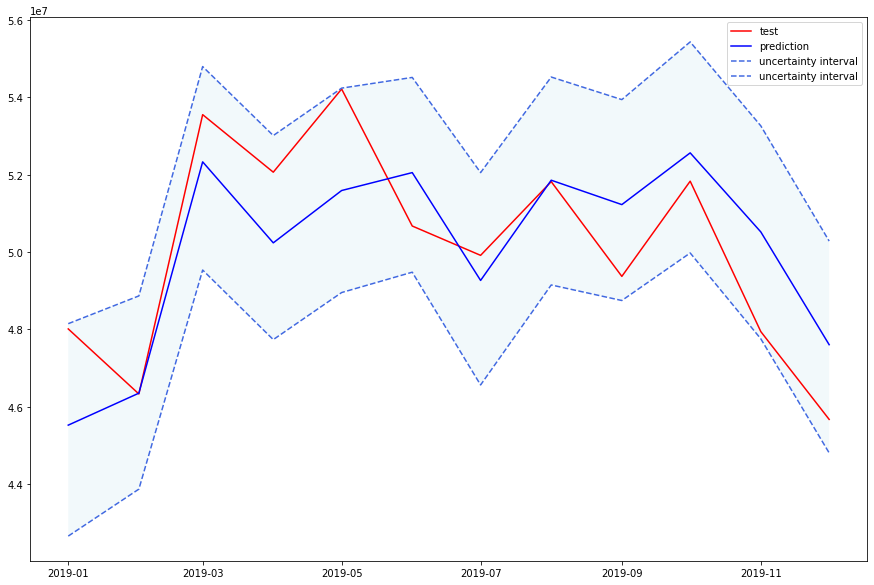

In [30]:
plt.figure(figsize=(15,10))


plt.plot(test_i['ds'], test_i['y'].values, c="red", label="test")
plt.plot(test_i['ds'], forecast_i['yhat'].values, c="blue", label="prediction")
plt.plot(test_i['ds'], forecast_i['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(test_i['ds'], forecast_i['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
ax.fill_between(test_i['ds'],  forecast_i['yhat_lower'], forecast_i['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.legend()
plt.show();

In [31]:
py.init_notebook_mode()

fig = plot_plotly(model_i, forecast_i)  
py.iplot(fig)

In [32]:
print("RMSE: ",sqrt(mean_squared_error(test_i['y'].values, forecast_i['yhat'].values))/10000000)

RMSE:  0.16972637851628058


After finding the best model for imports 2019, then fit the same model to the whole data frame for predicting import 2020:

In [33]:
model_i2 = Prophet(seasonality_mode='multiplicative',seasonality_prior_scale=15.0, interval_width=0.79, 
                  changepoint_prior_scale=0.011, uncertainty_samples=500)
model_i2.fit(mia_df_tr)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [34]:
future_i2 = model_i2.make_future_dataframe(periods=13, freq='M', include_history=False)

In [35]:
forecast_i2 = model_i2.predict(future_i2)
forecast_i2[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2019-12-31,4.730556e+07,4.443493e+07,5.020200e+07
1,2020-01-31,4.788709e+07,4.523662e+07,5.074271e+07
2,2020-02-29,5.419020e+07,5.155407e+07,5.674339e+07
3,2020-03-31,5.214406e+07,4.956789e+07,5.482157e+07
4,2020-04-30,5.361950e+07,5.101718e+07,5.631355e+07
5,2020-05-31,5.362958e+07,5.104658e+07,5.643730e+07
6,2020-06-30,5.088754e+07,4.841137e+07,5.354226e+07
7,2020-07-31,5.343984e+07,5.059877e+07,5.612292e+07
8,2020-08-31,5.256846e+07,4.973385e+07,5.542142e+07
9,2020-09-30,5.416090e+07,5.141916e+07,5.666752e+07


The above table shows the import amounts for each month in 2020 and the uncertainty bands, which we can see them in the below graphs, as well as the trends.

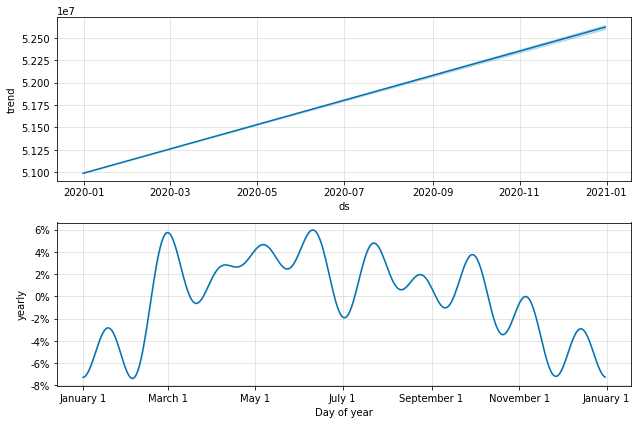

In [36]:
model_i2.plot_components(forecast_i2);

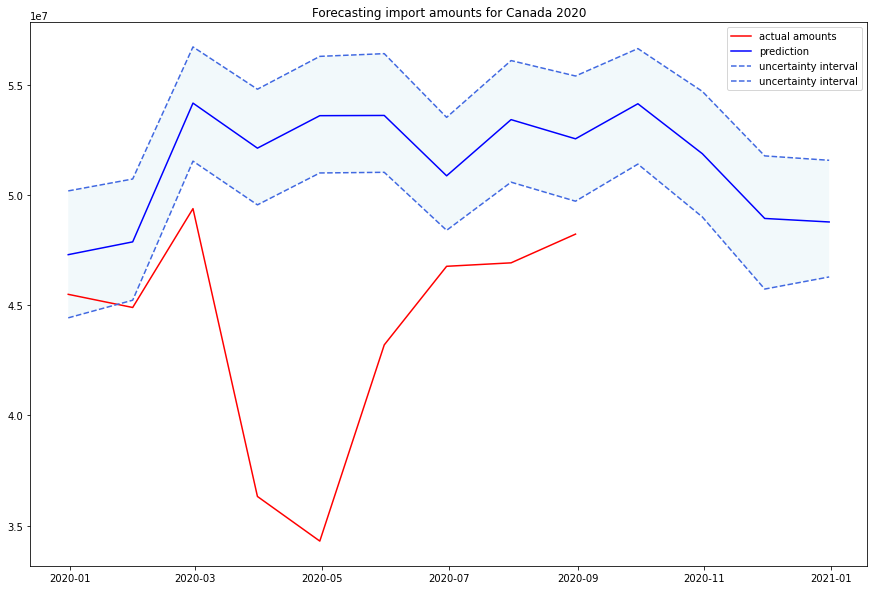

In [39]:
updated = [4.5503505e+07, 4.4905848e+07, 4.9396775e+07, 3.6320973e+07, 3.4293596e+07, 4.3207011e+07, 4.6777035e+07, 
          4.6933967e+07, 4.8238638e+07]

plt.figure(figsize=(15,10))

plt.plot(future2['ds'].iloc[0:9], updated, c="red", label="actual amounts" )
plt.plot(future_i2['ds'], forecast_i2['yhat'].values, c="blue", label="prediction")
plt.plot(future_i2['ds'], forecast_i2['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(future_i2['ds'], forecast_i2['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.title("Forecasting import amounts for Canada 2020")
ax = plt.gca()
ax.fill_between(future_i2['ds'],  forecast_i2['yhat_lower'], forecast_i2['yhat_upper'], facecolor='lightblue', alpha=0.15,
                interpolate=True)
plt.legend()
plt.show();

In [38]:
fig = plot_plotly(model_i2, forecast_i2)  
py.iplot(fig)